<a href="https://colab.research.google.com/github/gongx030/etv2_pioneer/blob/master/Etv2_H3k27ac_peaks.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Analysis of Pig Injury In Control and Embryo
By: Erik Skie

## Set Environment

Package List:
* [BiocParallel](https://bioconductor.org/packages/release/bioc/html/BiocParallel.html): for running parallel operations
* [devtools](https://cran.r-project.org/web/packages/devtools/index.html): for installing the latest version of ComplexHeatmap
* [knitr](https://cran.r-project.org/web/packages/knitr/index.html): for displaying prettier tables
*[biomart](https://bioconductor.org/packages/release/bioc/html/biomaRt.html): for querying GO information
*[ggwordcloud](https://cran.r-project.org/web/packages/ggwordcloud/vignettes/ggwordcloud.html): for generating wordclouds
*[tidyverse](https://cran.r-project.org/web/packages/tidyverse/index.html): for additional dataframe manipulation functions
* [suerat](https://cran.r-project.org/web/packages/Seurat/index.html): for performing single cell RNAseq analysis
* [summarizedexperiment](https://): for storing and organizing experiment data
* [rhdf5](https://): for letting R work on datasets larger than RAM
* [singlecellexperiment](https://): for S4 class
* [farver](https://): for faster color space conversion
* [stringdb](https://): for manipulating stringdb data and creating igraphs

In [ ]:
#@title Install packages
if (!requireNamespace("BiocManager", quietly = TRUE))
  install.packages("BiocManager")
BiocManager::install(c('BiocParallel', 'biomaRt', 'ggwordcloud',
                       'SummarizedExperiment', 'rhdf5', 'DESeq2', 'SingleCellExperiment', 
                       'STRINGdb', 'limma', 'goseq', 'org.Ss.eg.db', 'org.Hs.eg.db'), Ncpus = 2)
install.packages(c('devtools', 'knitr', 'tidyverse', 'farver', "Seurat"), Ncpus = 2)

In [ ]:
#@title Import packages
library(BiocParallel)
register(MulticoreParam(2))
library(devtools)
library(knitr)
library(biomaRt)
library(ggwordcloud)
library(Seurat)
library(rhdf5)
library(Matrix)
library(SummarizedExperiment)
library(SingleCellExperiment)
library(tidyverse)
library(farver)
library(STRINGdb)
library(scales) # hue_pal
library(DESeq2)
library(goseq)
library(org.Ss.eg.db)
library(org.Hs.eg.db)
theme_set(theme_bw())

## Download Datasets

The fastq files were processed by the `kallisto`, `bustools` and `BUSpaRse` pipeline

Information on the pre-processing of data can be found [here](https://github.com/gongx030/pig_injury_scRNAseq)

In [ ]:
#@title file directories
dirs <- c('FH_Embryo_FH1' = 'https://s3.msi.umn.edu/gongx030/datasets/dataset=JZ_scnaseq_version=20200917a/FH_Embryo/FH1/matrix.rds',
          'FH_Embryo_FH2' = 'https://s3.msi.umn.edu/gongx030/datasets/dataset=JZ_scnaseq_version=20200917a/FH_Embryo/FH2/matrix.rds',
          'CTL-P1_8094' = 'https://s3.msi.umn.edu/gongx030/datasets/dataset=JZ_scnaseq_version=20200917a/CTL-P1/8094/matrix.rds',
          'CTL-P1_8095' = 'https://s3.msi.umn.edu/gongx030/datasets/dataset=JZ_scnaseq_version=20200917a/CTL-P1/8095/matrix.rds',
          'CTL-P28_8046_BZ' = 'https://s3.msi.umn.edu/gongx030/datasets/dataset=JZ_scnaseq_version=20200917a/CTL-P28/8046_BZ/matrix.rds',
          'CTL-P28_8046_RZ' = 'https://s3.msi.umn.edu/gongx030/datasets/dataset=JZ_scnaseq_version=20200917a/CTL-P28/8046_RZ/matrix.rds',
          'CTL-P56_8052_AZ' = 'https://s3.msi.umn.edu/gongx030/datasets/dataset=JZ_scnaseq_version=20200917a/CTL-P56/8052_AZ/matrix.rds',
          'CTL-P56_8052_RZ' = 'https://s3.msi.umn.edu/gongx030/datasets/dataset=JZ_scnaseq_version=20200917a/CTL-P56/8052_RZ/matrix.rds'
          )

In [ ]:
#@title Download the barcode files
barcode_files <- sprintf('%s', dirs)
cat('remote filtered_feature_bc_matrix files:\n')
print(barcode_files)
local_barcode_files <- gsub('https://s3.msi.umn.edu/', './', barcode_files)
cat('local filtered_feature_bc_matrix files:\n')
print(local_barcode_files)
commands <- sprintf('wget -x -c -nH %s', barcode_files)
for (command in commands) system(command)
file.exists(local_barcode_files)

remote filtered_feature_bc_matrix files:
[1] "https://s3.msi.umn.edu/gongx030/datasets/dataset=JZ_scnaseq_version=20200917a/FH_Embryo/FH1/matrix.rds"  
[2] "https://s3.msi.umn.edu/gongx030/datasets/dataset=JZ_scnaseq_version=20200917a/FH_Embryo/FH2/matrix.rds"  
[3] "https://s3.msi.umn.edu/gongx030/datasets/dataset=JZ_scnaseq_version=20200917a/CTL-P1/8094/matrix.rds"    
[4] "https://s3.msi.umn.edu/gongx030/datasets/dataset=JZ_scnaseq_version=20200917a/CTL-P1/8095/matrix.rds"    
[5] "https://s3.msi.umn.edu/gongx030/datasets/dataset=JZ_scnaseq_version=20200917a/CTL-P28/8046_BZ/matrix.rds"
[6] "https://s3.msi.umn.edu/gongx030/datasets/dataset=JZ_scnaseq_version=20200917a/CTL-P28/8046_RZ/matrix.rds"
[7] "https://s3.msi.umn.edu/gongx030/datasets/dataset=JZ_scnaseq_version=20200917a/CTL-P56/8052_AZ/matrix.rds"
[8] "https://s3.msi.umn.edu/gongx030/datasets/dataset=JZ_scnaseq_version=20200917a/CTL-P56/8052_RZ/matrix.rds"
local filtered_feature_bc_matrix files:
[1] "./gongx030/datasets/datase

[1] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE

In [ ]:
#@title read in files
so <- lapply(1:length(local_barcode_files), function(i) readRDS(local_barcode_files[i]))
names(so) <- names(dirs)

In [ ]:
#@title sparse matrix condition information
for (i in 1:length(so)){
  cat(sprintf('condition=%s | number of features=%d | number of cells=%d\n', names(so)[i], nrow(so[[i]]), ncol(so[[i]])))
}

condition=FH_Embryo_FH1 | number of features=21989 | number of cells=9738
condition=FH_Embryo_FH2 | number of features=21724 | number of cells=8089
condition=CTL-P1_8094 | number of features=19612 | number of cells=422
condition=CTL-P1_8095 | number of features=21476 | number of cells=3520
condition=CTL-P28_8046_BZ | number of features=21134 | number of cells=4996
condition=CTL-P28_8046_RZ | number of features=21216 | number of cells=5820
condition=CTL-P56_8052_AZ | number of features=21821 | number of cells=8803
condition=CTL-P56_8052_RZ | number of features=21775 | number of cells=9242


In [ ]:
#@title Creating and Merging Suerat objects
time <- c('CTL-P1_8026_P1' = 1, 'CTL-P1_8094' = 1, 'CTL-P1_8095' = 1,
'CTL-P28_8046_BZ' = 28, 'CTL-P28_8046_RZ' = 28, 'CTL-P56_8052_AZ' = 56, 'CTL-P56_8052_RZ' = 56,
'FH_Embryo_FH1' = 0, 'FH_Embryo_FH2' = 0, 'FH_Embryo_FH3' = 0)
location = c('CTL-P1_8026_P1' = 'whole', 'CTL-P1_8094' = 'whole', 'CTL-P1_8095' = 'whole',
'CTL-P28_8046_BZ' = 'BZ', 'CTL-P28_8046_RZ' = 'RZ', 'CTL-P56_8052_AZ' = 'AZ', 'CTL-P56_8052_RZ' = 'RZ',
'FH_Embryo_FH1' = 'whole', 'FH_Embryo_FH2' = 'whole', 'FH_Embryo_FH3' = 'whole')
so <- lapply(names(so), function(i) {
  X <- so[[i]]
  X <- X[order(rowSums(X), decreasing = TRUE), ]
  X <- X[!duplicated(rownames(X)), ] # remove duplicated rownames
  y <- CreateSeuratObject(counts = X, min.cells = 5, min.features = 500, project = i)
  y[["percent.mt"]] <- PercentageFeatureSet(y, pattern = "^MT-")
  y[["percent.rpl"]] <- PercentageFeatureSet(y, pattern = "^RPL")
  y[["percent.rps"]] <- PercentageFeatureSet(y, pattern = "^RPS")
  y[["time"]] <- time[i]
  y[["location"]] <- location[i]
  y
})
names(so) <- names(dirs)
so <- merge(so[[1]], y = c(so[2:length(so)]), add.cell.ids = names(so))
so <- subset(so, nFeature_RNA > 200 & percent.mt < 1)

In [ ]:
#@title setting cardiac progenitor genes
genes = c('MYL2', 'MYL3', 'MYL7', 'MYH7')

In [ ]:
#@title Centering and scaling data matrix
so <- so %>%
NormalizeData() %>%
ScaleData()

Centering and scaling data matrix



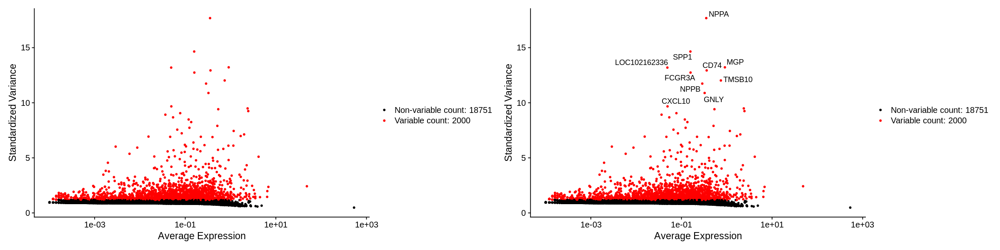

In [ ]:
#@title Plotting variable features
options(repr.plot.width = 20, repr.plot.height = 5)
so <- FindVariableFeatures(so, selection.method = 'vst')
top10 <- head(VariableFeatures(so), 10)
options(repr.plot.width = 20, repr.plot.height = 5)
plot1 <- VariableFeaturePlot(so)
plot2 <- LabelPoints(plot = plot1, points = top10, repel = TRUE, xnudge = 0, ynudge = 0)
plot1 + plot2

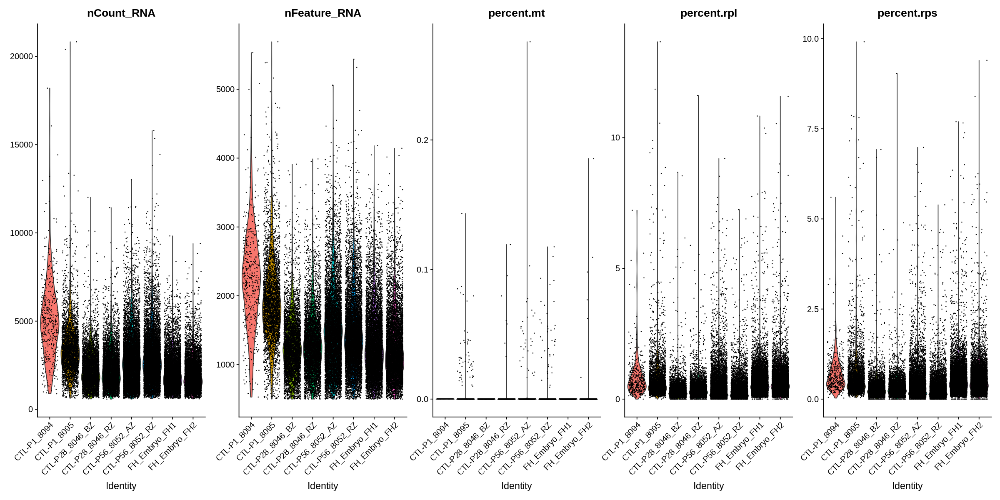

In [ ]:
#@title Feature Violin Plot
options(repr.plot.width = 20, repr.plot.height = 10)
VlnPlot(so, c("nCount_RNA", "nFeature_RNA", 'percent.mt', 'percent.rpl', 'percent.rps'), pt.size = 0.1, ncol = 5)

In [ ]:
#@title Cell Cycle Scoring Analysis
# A list of cell cycle markers, from Tirosh et al, 2015, is loaded with Seurat.  We can
# segregate this list into markers of G2/M phase and markers of S phase
gc()
s.genes <- cc.genes$s.genes
g2m.genes <- cc.genes$g2m.genes
so <- CellCycleScoring(so, s.features = s.genes, g2m.features = g2m.genes, set.ident = TRUE)
so <- RunPCA(so, features = VariableFeatures(so))

,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,9682161,517.1,17193335,918.3,17193335,918.3
Vcells,1253250106,9561.6,2986845382,22787.9,2574720967,19643.6


Warning message:
“The following features are not present in the object: MCM5, MLF1IP, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: FAM64A, TUBB4B, HN1, not searching for symbol synonyms”
PC_ 1 
Positive:  COL1A1, COL3A1, DCN, COL1A2, GSN, SPON2, MFAP5, EPB41L2, COL5A2, SPARC 
	   IGF2, LTBP4, VIM, MARCKS, MEG3, TMSB4X, TMSB10, TIMP2, EBF1, RRBP1 
	   LOC100623720, FSTL1, SPARCL1, LUM, COL14A1, EMP1, AKAP12, FBN1, FN1, MGP 
Negative:  TTN, NEBL, RYR2, RBM24, FHL2, MYBPC3, SLC8A1, CMYA5, SORBS2, MYH7B 
	   ATP2A2, PPARGC1A, PDLIM5, PDE4D, SORBS1, TNNT2, ANKRD1, SLC25A4, MYH7, ABLIM1 
	   DMD, LDB3, LOC100624559, TPM2, NEXN, ACTN2, RBPMS, LMO7, CRYBG3, NRAP 
PC_ 2 
Positive:  DCN, COL1A1, COL1A2, COL3A1, ADGRD1, MFAP5, MEG3, GSN, SPON2, COL5A2 
	   LOC110261648, LOC100623720, IGF2, FSTL1, TBX20, LTBP4, SPARC, LUM, COL4A1, COL14A1 
	   MFAP4, POSTN, FN1, LOC110257158, OGN, LAMC1, COL6A3, MGP, PDGFRA, COL21A1 
Negative:  SLA-2, S

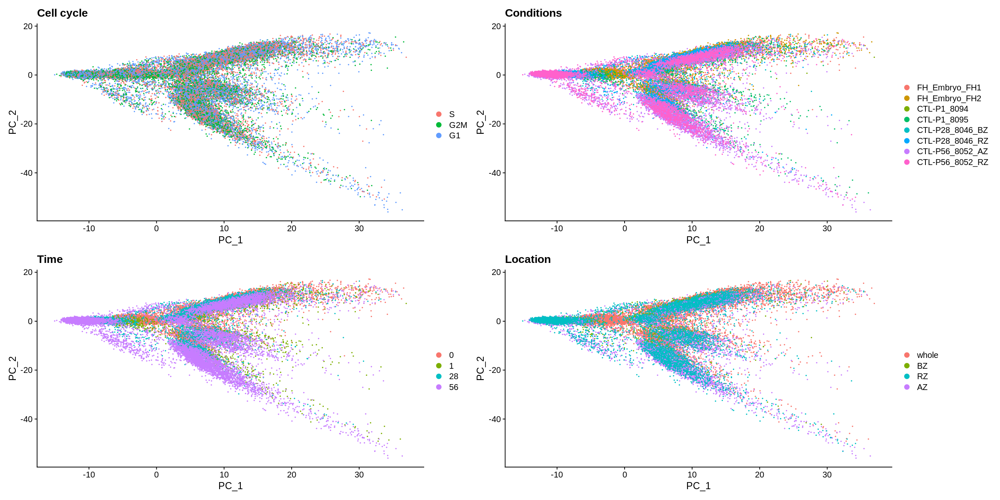

In [ ]:
#@title dimension plots
options(repr.plot.width = 20, repr.plot.height = 10)
Idents(so) <- 'Phase'
plot1 = DimPlot(so, reduction = "pca", pt.size = 0.25) + ggtitle(label = "Cell cycle")
Idents(so) <- 'orig.ident'
plot2 = DimPlot(so, reduction = "pca", pt.size = 0.25) + ggtitle(label = "Conditions")
Idents(so) <- 'time'
plot3 = DimPlot(so, reduction = "pca", pt.size = 0.25) + ggtitle(label = "Time")
Idents(so) <- 'location'
plot4 = DimPlot(so, reduction = "pca", pt.size = 0.25) + ggtitle(label = "Location")
plot1 + plot2 + plot3 + plot4

In [ ]:
#@title regressing out confounds
gc()
so <- ScaleData(object = so, vars.to.regress = c('nCount_RNA', "nFeature_RNA", 'percent.mt', 'percent.rpl', 'percent.rps', 'S.Score', 'G2M.Score', 'Phase'))

,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,9700972,518.1,17193335,918.3,17193335,918.3
Vcells,1256569914,9586.9,2986845382,22787.9,2574720967,19643.6


Regressing out nCount_RNA, nFeature_RNA, percent.mt, percent.rpl, percent.rps, S.Score, G2M.Score, Phase

Centering and scaling data matrix



In [ ]:
#@title finding variable features and running PCA
so <- FindVariableFeatures(so, selection.method = 'vst', nfeatures = 2000)
so <- RunPCA(so, features = VariableFeatures(so))

PC_ 1 
Positive:  TTN, NEBL, RYR2, RBM24, SORBS2, SLC8A1, MYBPC3, CMYA5, PDLIM5, MYH7B 
	   PDE4D, ATP2A2, FHL2, MYH7, SORBS1, SLC25A4, ACTC1, TNNT2, MYL2, PPARGC1A 
	   LMO7, LDB3, TPM2, DMD, TNNI3, LOC100624559, ANKRD1, ABLIM1, NEXN, TCAP 
Negative:  COL1A1, DCN, COL3A1, COL1A2, GSN, MFAP5, MEG3, SPON2, COL5A2, LTBP4 
	   LOC100623720, IGF2, SPARC, EBF1, MGP, LUM, EPB41L2, COL14A1, FSTL1, LOC100520512 
	   SPARCL1, COL15A1, TNXB, SPRY2, COL4A1, COL6A3, PDGFRA, FBN1, ADGRD1, LOC110261648 
PC_ 2 
Positive:  TTN, NREP, RBM24, SORBS2, RYR2, ABLIM1, NEBL, SLC8A1, PDE4D, PDLIM5 
	   MYH7B, CMYA5, ACTC1, ATP2A2, MYL2, MYH7, CDH2, FHL2, DMD, RBPMS 
	   LMO7, SOX4, TNNT2, SORBS1, MYBPC3, TNNI3, SLC25A4, LOC110256756, EFNA5, TBX20 
Negative:  SLA-2, SLA-1, SLA-3, PTPRC, CD74, LOC100519098, B2M, FCGR3A, ADGRG1, GIMAP1 
	   GBP1, SLA-DQB1, LAPTM5, KLF2, IFI6, PARP14, SLA-DRA, ITGAL, ITGB2, IFITM1 
	   ADGRE5, TMSB4X, SLA-DRB1, SLA-DQA1, LOC110255360, CCL5, HERC6, RGS19, APBB1IP, CSF1R 
PC_ 3 
Po

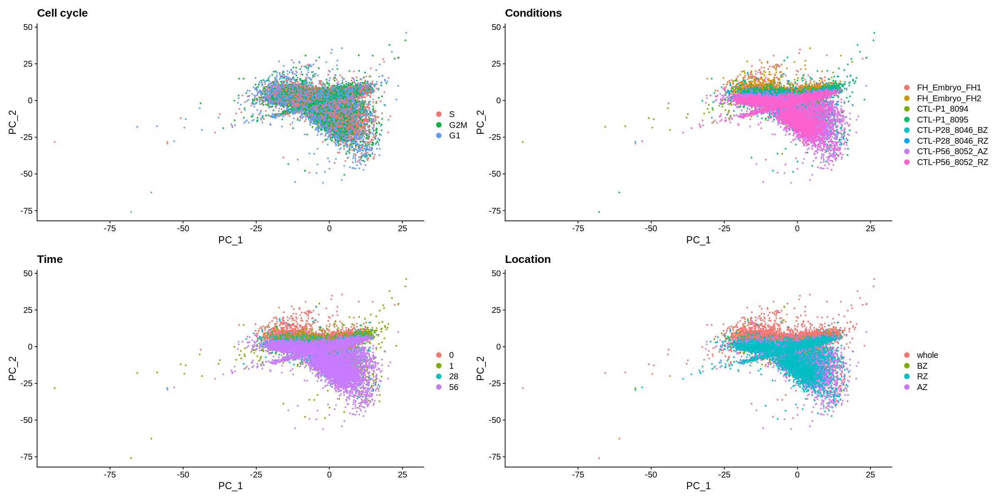

In [ ]:
#@title dimension plots after regression
options(repr.plot.width = 20, repr.plot.height = 10)
Idents(so) <- 'Phase'
plot1 <- DimPlot(so, reduction = "pca", pt.size = 0.5) + ggtitle(label = "Cell cycle")
Idents(so) <- 'orig.ident'
plot2 <- DimPlot(so, reduction = "pca", pt.size = 0.5) + ggtitle(label = "Conditions")
Idents(so) <- 'time'
plot3 <- DimPlot(so, reduction = "pca", pt.size = 0.5) + ggtitle(label = "Time")
Idents(so) <- 'location'
plot4 = DimPlot(so, reduction = "pca", pt.size = 0.5) + ggtitle(label = "Location")
plot1 + plot2 + plot3 + plot4

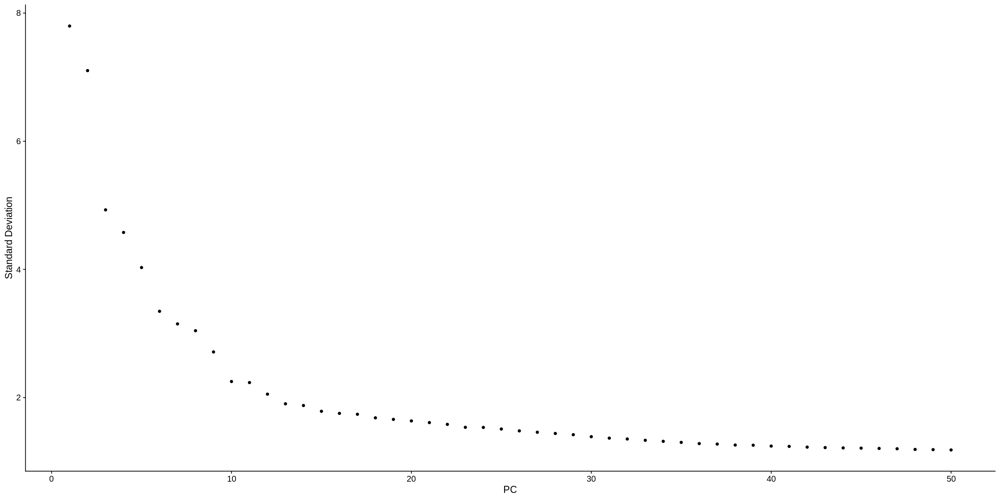

In [ ]:
#@title elbow plot
options(repr.plot.width = 20, repr.plot.height = 10)
ElbowPlot(so, ndims = 50)

In [ ]:
#@title Run UMAP and Leiden clustering
so <- RunUMAP(so, reduction = 'pca', dims = 1:20, min.dist = 0.75, verbose = FALSE)
# Leiden clustering
so <- FindNeighbors(so, reduction = 'umap', dims = 1:2)
so <- FindClusters(so, resolution = 0.05)
# store the current identities in a new column of meta.data called cluster
so$cluster <- Idents(so)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 49505
Number of edges: 1110372

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9924
Number of communities: 11
Elapsed time: 4 seconds


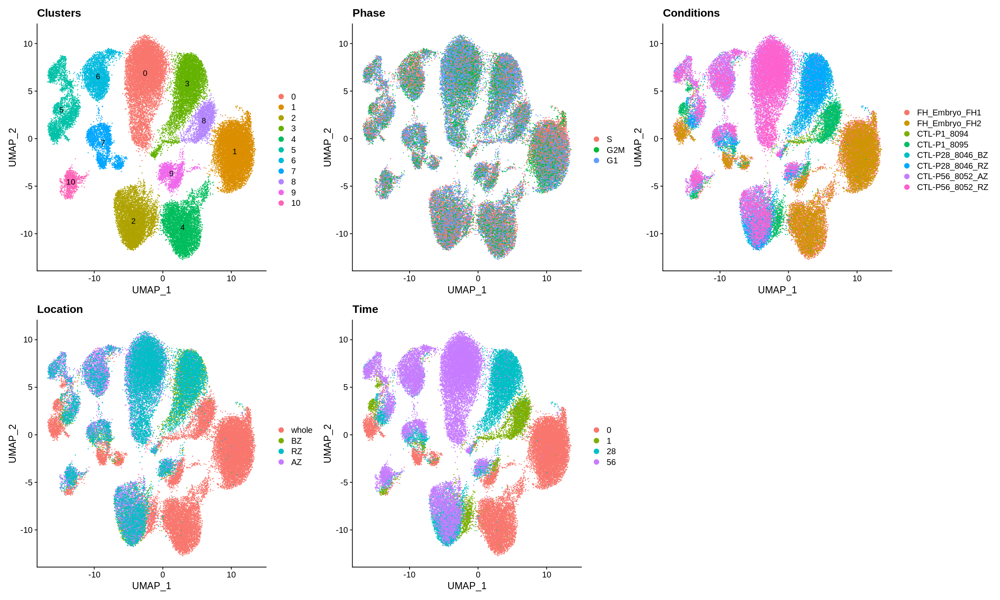

In [ ]:
#@title plot UMAP
options(repr.plot.width = 20, repr.plot.height = 12)
Idents(so) <- 'cluster'
p1 <- DimPlot(so, reduction = "umap", pt.size = 0.1, label = TRUE) + ggtitle(label = "Clusters")
Idents(so) <- 'Phase'
p2 <- DimPlot(so, reduction = "umap", pt.size = 0.1) + ggtitle(label = "Phase")
Idents(so) <- 'orig.ident'
p3 <- DimPlot(so, reduction = "umap", pt.size = 0.1) + ggtitle(label = "Conditions")
Idents(so) <- 'location'
p4 = DimPlot(so, reduction = "umap", pt.size = 0.1) + ggtitle(label = "Location")
Idents(so) <- 'time'
p5 = DimPlot(so, reduction = "umap", pt.size = 0.1) + ggtitle(label = "Time")
p1 + p2 + p3 + p4 + p5

In [ ]:
#@title Identify cluster specific genes
Idents(so) <- 'cluster'
so_markers_fh_all <- FindMarkers(so, ident.1 = c(1), ident.2 = c(0,2,3,4,5,6,7,8,9,10), test.use = "wilcox", only.pos = FALSE, min.pct = 0.25, logfc.threshold = 0.25) #compare fetal cardiac cluster vs all other clusters
so_markers_ca_all <- FindMarkers(so, ident.1 = c(0,1,3,8), ident.2 = c(2,4,5,6,7,9,10), test.use = "wilcox", only.pos = FALSE, min.pct = 0.25, logfc.threshold = 0.25)#compare cardiac clusters vs all other clusters
so_markers_fh_ca <- FindMarkers(so, ident.1 = c(1), ident.2 = c(0,3,8), test.use = "wilcox", only.pos = FALSE, min.pct = 0.25, logfc.threshold = 0.25)#compare fetal cardiac cluster vs all other cardiac clusters

## Embryo cardiac cluster vs all other clusters

In [ ]:
#@title top differentially expressed genes
so_markers_fh_all = so_markers_fh_all[order(so_markers_fh_all$pct.1/so_markers_fh_all$pct.2, decreasing = TRUE),]
head(so_markers_fh_all)
cat("total hits: ", length(rownames(so_markers_fh_all)))

,p_val,avg_logFC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
LOC110257297,0,1.5897594,0.459,0.018,0
NRXN3,0,1.2177654,0.421,0.058,0
VCAM1,0,0.9566113,0.326,0.050,0
HBB,0,0.6677634,0.264,0.055,0
PHEX,0,1.0931086,0.397,0.090,0
LOC110256885,0,1.3081062,0.566,0.147,0


total hits:  480

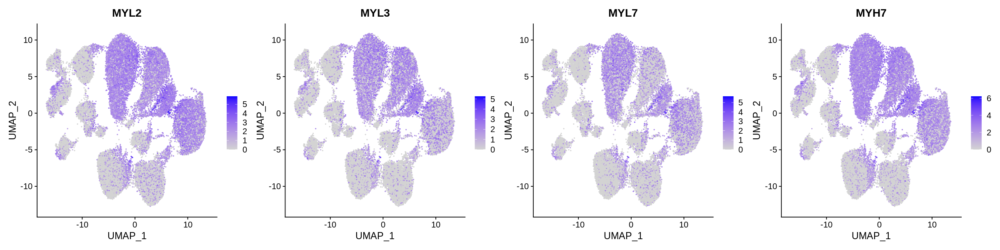

In [ ]:
#@title plot differentially expressed genes
#Genes = c(rownames(so_markers_fh_all)[1:10], genes)
options(repr.plot.width = 20, repr.plot.height = round(length(genes) / 4)*5)
FeaturePlot(so_test, dims = c(1, 2), features = genes, pt.size = 0.25, cols = c('lightgrey', 'blue'), ncol = 4)

Loading hg19 length data...

Warning message in pcls(G):
“initial point very close to some inequality constraints”
Fetching GO annotations...

Calculating the p-values...

'select()' returned 1:1 mapping between keys and columns



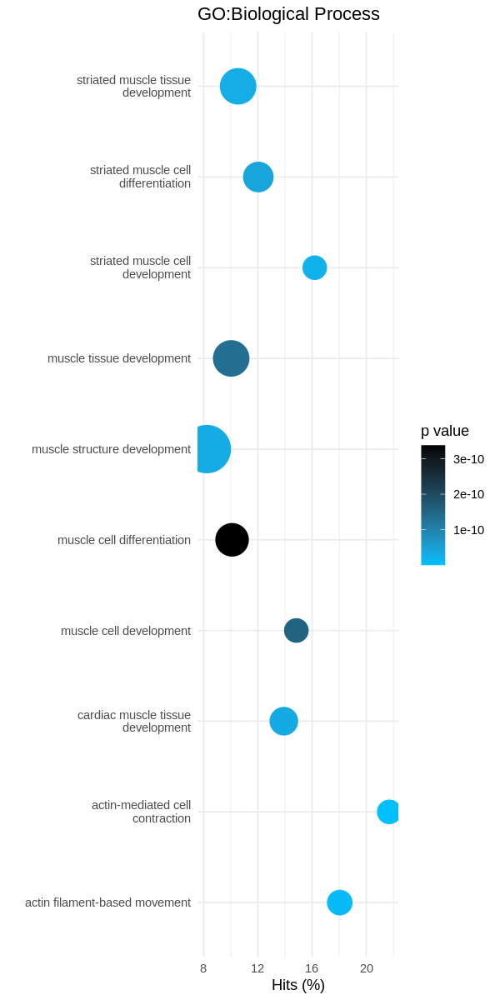

In [ ]:
#@title Pathway Analysis of differentially expressed genes
up_reg = as.integer(so_markers_fh_all$p_val < 1e-3 & so_markers_fh_all$avg_logFC > log2(1/2))
names(up_reg) = rownames(so_markers_fh_all)
up_reg = up_reg[which(!duplicated(names(up_reg)))]
binary_genes = as.integer(rownames(so) == "this is a workaround to coerce everything to zero")
names(binary_genes) = rownames(so)
binary_genes = binary_genes[which(!names(binary_genes) %in% names(up_reg))]
binary_genes = c(up_reg, binary_genes)
pwf <- nullp(binary_genes, 'hg19', "geneSymbol", plot.fit = FALSE)
go_res_BP = goseq(pwf, 'hg19',"geneSymbol", test.cats = c("GO:BP"), use_genes_without_cat=TRUE)
options(repr.plot.width = 5, repr.plot.height = 10)
go_res_BP %>%
    dplyr::filter(numInCat < 1000) %>%
    top_n(10, wt = -over_represented_pvalue) %>%
    mutate(hitsPerc = numDEInCat*100/numInCat, term = str_wrap(term, 30)) %>%
    ggplot(aes(x = hitsPerc, y = term, colour = over_represented_pvalue, size = numDEInCat)) + 
    geom_point(size = top_n(go_res_BP, 10, wt = -over_represented_pvalue)$numDEInCat/3) +
    scale_color_gradient(low = "deepskyblue", high = "black") + 
    labs(title = "GO:Biological Process", x="Hits (%)", y="", colour="p value", size="Count") +
    theme(axis.text = element_text(size = 15, face = 'bold')) + 
    theme(legend.text = element_text(size = 15, face = 'bold')) + 
    theme(legend.title = element_text(size = 15, face = 'bold')) +
    theme_minimal()

## All cardiac clusters vs all other clusters

In [ ]:
#@title top differentially expressed genes
so_markers_ca_all = so_markers_ca_all[order(so_markers_ca_all$pct.1/so_markers_ca_all$pct.2, decreasing = TRUE),]
head(so_markers_ca_all)
cat("total hits: ", length(rownames(so_markers_ca_all)))

,p_val,avg_logFC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
LOC110260190,0,0.9706804,0.351,0.026,0
DDIT4L,0,0.8499591,0.294,0.023,0
FHOD3,0,1.2869936,0.506,0.040,0
MYPN,0,1.0557682,0.378,0.030,0
LOC110260218,0,0.8701499,0.301,0.024,0
MLIP,0,1.3958729,0.596,0.049,0


total hits:  696

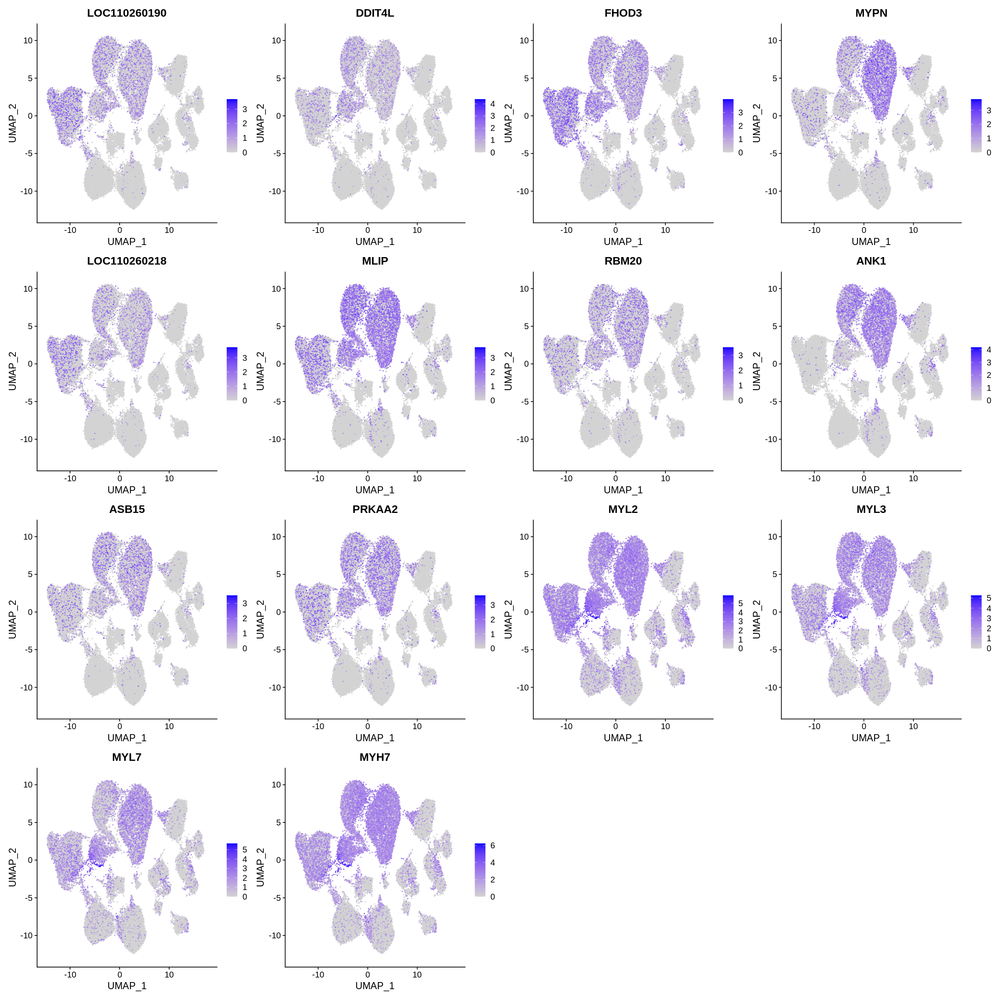

In [ ]:
#@title plot differentially expressed genes
Genes = c(rownames(so_markers_ca_all)[1:10], genes)
options(repr.plot.width = 20, repr.plot.height = round(length(Genes) / 4)*5)
FeaturePlot(so, dims = c(1, 2), features = Genes, pt.size = 0.25, cols = c('lightgrey', 'blue'), ncol = 4)

Loading hg19 length data...

Warning message in pcls(G):
“initial point very close to some inequality constraints”
Fetching GO annotations...

Calculating the p-values...

'select()' returned 1:1 mapping between keys and columns



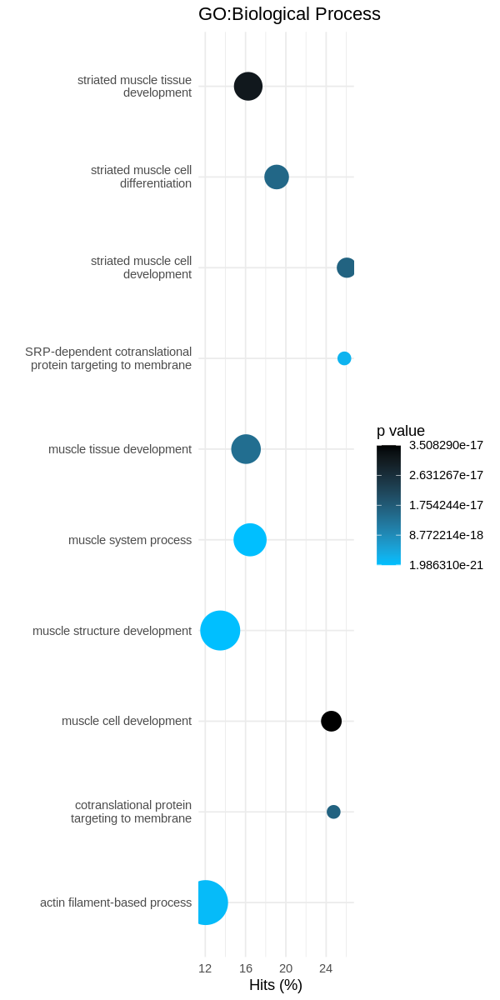

In [ ]:
#@title Pathway Analysis of differentially expressed genes
up_reg = as.integer(so_markers_ca_all$p_val < 1e-3 & so_markers_ca_all$avg_logFC > log2(1/2))
names(up_reg) = rownames(so_markers_ca_all)
up_reg = up_reg[which(!duplicated(names(up_reg)))]
binary_genes = as.integer(rownames(so) == "this is a workaround to coerce everything to zero")
names(binary_genes) = rownames(so)
binary_genes = binary_genes[which(!names(binary_genes) %in% names(up_reg))]
binary_genes = c(up_reg, binary_genes)
pwf <- nullp(binary_genes, 'hg19', "geneSymbol", plot.fit = FALSE)
go_res_BP = goseq(pwf, 'hg19',"geneSymbol", test.cats = c("GO:BP"), use_genes_without_cat=TRUE)
options(repr.plot.width = 5, repr.plot.height = 10)
go_res_BP %>%
    dplyr::filter(numInCat < 1000) %>%
    top_n(10, wt = -over_represented_pvalue) %>%
    mutate(hitsPerc = numDEInCat*100/numInCat, term = str_wrap(term, 30)) %>%
    ggplot(aes(x = hitsPerc, y = term, colour = over_represented_pvalue, size = numDEInCat)) + 
    geom_point(size = top_n(go_res_BP, 10, wt = -over_represented_pvalue)$numDEInCat/6) +
    scale_color_gradient(low = "deepskyblue", high = "black") + 
    labs(title = "GO:Biological Process", x="Hits (%)", y="", colour="p value", size="Count") +
    theme(axis.text = element_text(size = 15, face = 'bold')) + 
    theme(legend.text = element_text(size = 15, face = 'bold')) + 
    theme(legend.title = element_text(size = 15, face = 'bold')) +
    theme_minimal()

## Fetal cardiac clusters vs all other cardiac clusters

In [ ]:
#@title top differentially expressed genes
so_markers_fh_ca = so_markers_fh_ca[order(so_markers_fh_ca$pct.1/so_markers_fh_ca$pct.2, decreasing = TRUE),]
head(so_markers_fh_ca)
cat("total hits: ", length(rownames(so_markers_fh_ca)))

,p_val,avg_logFC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
LOC110260190,0,0.9706804,0.351,0.026,0
DDIT4L,0,0.8499591,0.294,0.023,0
FHOD3,0,1.2869936,0.506,0.040,0
MYPN,0,1.0557682,0.378,0.030,0
LOC110260218,0,0.8701499,0.301,0.024,0
MLIP,0,1.3958729,0.596,0.049,0


total hits:  696

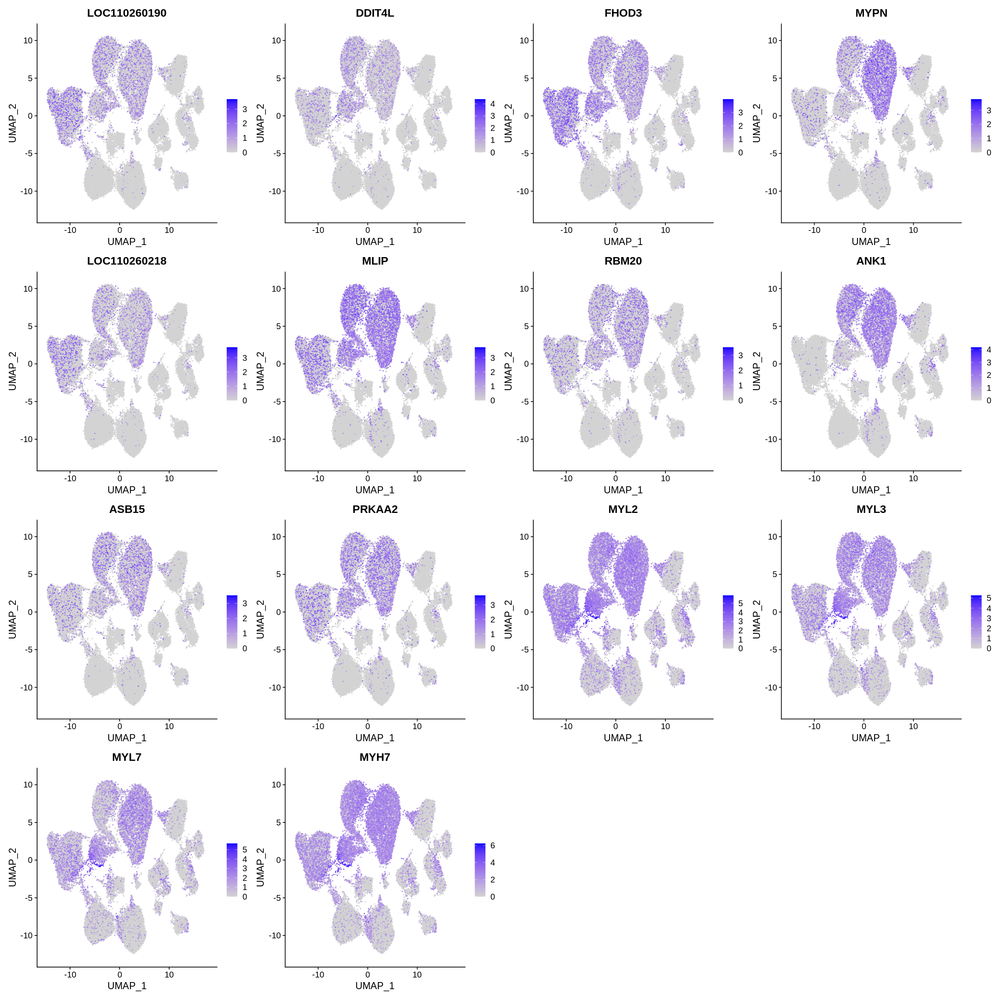

In [ ]:
#@title plot differentially expressed genes
Genes = c(rownames(so_markers_fh_ca)[1:10], genes)
options(repr.plot.width = 20, repr.plot.height = round(length(Genes) / 4)*5)
FeaturePlot(so, dims = c(1, 2), features = Genes, pt.size = 0.25, cols = c('lightgrey', 'blue'), ncol = 4)

Loading hg19 length data...

Warning message in pcls(G):
“initial point very close to some inequality constraints”
Fetching GO annotations...

Calculating the p-values...

'select()' returned 1:1 mapping between keys and columns



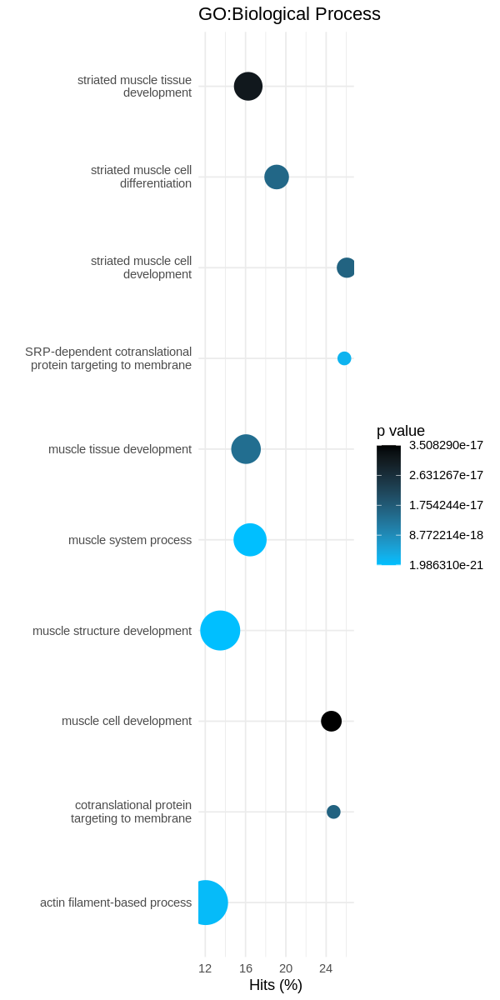

In [ ]:
#@title Pathway Analysis of differentially expressed genes
up_reg = as.integer(so_markers_fh_ca$p_val < 1e-3 & so_markers_fh_ca$avg_logFC > log2(1/2))
names(up_reg) = rownames(so_markers_fh_ca)
up_reg = up_reg[which(!duplicated(names(up_reg)))]
binary_genes = as.integer(rownames(so) == "this is a workaround to coerce everything to zero")
names(binary_genes) = rownames(so)
binary_genes = binary_genes[which(!names(binary_genes) %in% names(up_reg))]
binary_genes = c(up_reg, binary_genes)
pwf <- nullp(binary_genes, 'hg19', "geneSymbol", plot.fit = FALSE)
go_res_BP = goseq(pwf, 'hg19',"geneSymbol", test.cats = c("GO:BP"), use_genes_without_cat=TRUE)
options(repr.plot.width = 5, repr.plot.height = 10)
go_res_BP %>%
    dplyr::filter(numInCat < 1000) %>%
    top_n(10, wt = -over_represented_pvalue) %>%
    mutate(hitsPerc = numDEInCat*100/numInCat, term = str_wrap(term, 30)) %>%
    ggplot(aes(x = hitsPerc, y = term, colour = over_represented_pvalue, size = numDEInCat)) + 
    geom_point(size = top_n(go_res_BP, 10, wt = -over_represented_pvalue)$numDEInCat/6) +
    scale_color_gradient(low = "deepskyblue", high = "black") + 
    labs(title = "GO:Biological Process", x="Hits (%)", y="", colour="p value", size="Count") +
    theme(axis.text = element_text(size = 15, face = 'bold')) + 
    theme(legend.text = element_text(size = 15, face = 'bold')) + 
    theme(legend.title = element_text(size = 15, face = 'bold')) +
    theme_minimal()

# Session Information

In [ ]:
#@title R Session Information
sessionInfo()

In [ ]:
#@title Run time
Sys.time() - start_time0

# RND

## cardiac gene encrichment function declaration

In [ ]:
#@title Cardiac Enrichment function
Cardiac_Enrichment = function(c, nclusters = 10, cardiac_genes = c('MYL2', 'MYL3', 'MYL7', 'MYH7')){   ###This function returns a list containing plot objects and matrices storing gene upregulated in the embryonic condition and downregulated in the P56 timepoints
  # Merge Suerat Objects
  cat('Merging Suerat Objects \n')
  so = lapply(c, function(c) so[[c]])
  so <- merge(so[[1]], y = c(so[2:length(so)]), add.cell.ids = c)
  # Centering and scaling data matrix
  so <- so %>%
  NormalizeData() %>%
  ScaleData()
  # Plotting variable features
  cat('Plotting variable features \n')
  so <- FindVariableFeatures(so, selection.method = 'vst')
  top10 <- head(VariableFeatures(so), 10)
  options(repr.plot.width = 20, repr.plot.height = 5)
  plot1 <- VariableFeaturePlot(so)
  plot2 <- LabelPoints(plot = plot1, points = top10, repel = TRUE)
  # Feature Violin Plot
  plot3 = VlnPlot(so, c("nCount_RNA", "nFeature_RNA", 'percent.mt', 'percent.rpl', 'percent.rps'), pt.size = 0.1, ncol = 5)
  # Cell Cycle Scoring Analysis
  cat('Performing Cell Cycle Scoring Analysis \n')
  # A list of cell cycle markers, from Tirosh et al, 2015, is loaded with Seurat.  We can
  # segregate this list into markers of G2/M phase and markers of S phase
  s.genes <- cc.genes$s.genes
  g2m.genes <- cc.genes$g2m.genes
  so <- CellCycleScoring(so, s.features = s.genes, g2m.features = g2m.genes, set.ident = TRUE)
  so <- RunPCA(so, features = VariableFeatures(so))
  # Cell cycle dimension plot
  cat('Plotting dimensions 1 and 2 for Cell cycle and Condition \n')
  Idents(so) <- 'Phase'
  plot4 = DimPlot(so, reduction = "pca", pt.size = 0.5) + ggtitle(label = "Cell cycle")
  Idents(so) <- 'orig.ident'
  plot5 = DimPlot(so, reduction = "pca", pt.size = 0.5) + ggtitle(label = "Conditions")
  Idents(so) <- 'time'
  plot6 = DimPlot(so, reduction = "pca", pt.size = 0.5) + ggtitle(label = "Time")
  # regressing out confounds
  so <- ScaleData(object = so, vars.to.regress = c('nCount_RNA', "nFeature_RNA", 'percent.mt', 'percent.rpl', 'percent.rps', 'S.Score', 'G2M.Score', 'Phase'))
  # Refinding and running variable features and PCA
  cat('Finding variable features and running PCA \n')
  so <- FindVariableFeatures(so, selection.method = 'vst', nfeatures = 2000)
  so <- RunPCA(so, features = VariableFeatures(so))
  # Plot PCA dimensions 1 and 2
  cat('Replotting dimensions 1 and 2 for Cell cycle and Condition \n')
  Idents(so) <- 'Phase'
  plot7 <- DimPlot(so, reduction = "pca", pt.size = 0.5) + ggtitle(label = "Cell cycle")
  Idents(so) <- 'orig.ident'
  plot8 <- DimPlot(so, reduction = "pca", pt.size = 0.5) + ggtitle(label = "Conditions")
  Idents(so) <- 'time'
  plot9 <- DimPlot(so, reduction = "pca", pt.size = 0.5) + ggtitle(label = "Time")
  # plot elbow plot
  cat('Plotting elbow plot \n')
  plot10 = ElbowPlot(so, ndims = 50)
  #Run UMAP
  cat('Running UMAP \n')
  so <- RunUMAP(so, reduction = 'pca', dims = 1:nclusters, min.dist = 0.75, verbose = FALSE)
  # Leiden clustering
  cat('Clustering \n')
  so <- FindNeighbors(so, reduction = 'umap', dims = 1:2)
  so <- FindClusters(so, resolution = 0.15)
  # store the current identities in a new column of meta.data called cluster
  so$cluster <- Idents(so)
  #plot UMAP
  cat('Plotting UMAP \n')
  Idents(so) <- 'cluster'
  plot11 <- DimPlot(so, reduction = "umap", pt.size = 0.25, label = TRUE) + ggtitle(label = "Clusters")
  Idents(so) <- 'Phase'
  plot12 <- DimPlot(so, reduction = "umap", pt.size = 0.25) + ggtitle(label = "Phase")
  Idents(so) <- 'orig.ident'
  plot13 <- DimPlot(so, reduction = "umap", pt.size = 0.25) + ggtitle(label = "Conditions")
  #Identify cluster specific genes
  Idents(so) <- 'cluster'
  so_markers <- FindAllMarkers(so, test.use = "wilcox", only.pos = FALSE, min.pct = 0.25, logfc.threshold = 0.25)
  #Filter for cardiac genes upregulated in the earlier condition
  clust <- so_markers[so_markers$gene %in% genes, ] %>%
           distinct(cluster, .keep_all = TRUE)
  so_markers_filtered <- so_markers[so_markers$cluster %in% clust$cluster, ]
  cat('Table of differentially expressed genes in cardiac gene cluster \n')
  print(kable(head(so_markers_filtered)))
  #plot differentially expressed genes
  genes <- c(cardiac_genes)
  plot14 = FeaturePlot(so, dims = c(1, 2), features = genes, pt.size = 0.25, cols = c('lightgrey', 'blue'), ncol = 4)
  #Plot plots
  cat('Variable features plot')
  plot(plot2)
  plot(plot3)
  plot(plot4 + plot5 + plot6)
  cat('Preprocessed dimension plots')
  plot(plot7 + plot8 + plot9)
  cat('Regressed for confounds dimension plots')
  plot(plot10)
  cat('Elbow plot for dimensions')
  plot(plot11 + plot12 + plot13)
  cat('UMAP clustered plots')
  plot(plot14)
  options(repr.plot.width = 20, repr.plot.height = round(length(genes) / 4)*5)
  cat('Differentially expressed genes in cardiac clusters')
  return(list('gene_enrichment' = so_markers_filtered, 'clust_plot' = plot11, 'phase_plot' = plot12,
  'cond_plot' = plot13))
}

## Data processing

Merging Suerat Objects 


Centering and scaling data matrix



Plotting variable features 


When using repel, set xnudge and ynudge to 0 for optimal results



Performing Cell Cycle Scoring Analysis 


Warning message:
“The following features are not present in the object: MCM5, MLF1IP, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: FAM64A, TUBB4B, HN1, not searching for symbol synonyms”
PC_ 1 
Positive:  TTN, NEBL, RYR2, FHL2, RBM24, PPARGC1A, MYBPC3, SLC8A1, MYH7B, CMYA5 
	   ATP2A2, ANKRD1, SORBS2, NR4A3, PDE4D, MYH7, PDLIM5, SLC25A4, TNNT2, LOC110261971 
	   SORBS1, DMD, ACTN2, NRAP, NEXN, CRYBG3, ABLIM1, LOC102162071, LDB3, TPM2 
Negative:  COL1A1, COL3A1, DCN, COL1A2, GSN, SPON2, IGF2, EPB41L2, SPARC, MFAP5 
	   LTBP4, COL5A2, MARCKS, MEG3, VIM, TMSB10, FSTL1, TIMP2, FN1, EBF1 
	   AKAP12, SPARCL1, POSTN, RRBP1, TMSB4X, COL14A1, EMP1, FBN1, VCAN, OGN 
PC_ 2 
Positive:  COL1A2, COL3A1, COL1A1, DCN, SPON2, ADGRD1, MEG3, GSN, MFAP5, TBX20 
	   LOC110261648, COL5A2, FSTL1, IGF2, SPARC, POSTN, LTBP4, FN1, VCAN, COL14A1 
	   LOC110259223, COL21A1, OGN, MATN2, PRELP, LOC110257158, ASPN, MFAP4, COL4A1, LOC100623720 
Negative: 

Plotting dimensions 1 and 2 for Cell cycle and Condition 


Regressing out nCount_RNA, nFeature_RNA, percent.mt, percent.rpl, percent.rps, S.Score, G2M.Score, Phase

Centering and scaling data matrix



Finding variable features and running PCA 


PC_ 1 
Positive:  NEBL, TTN, MYBPC3, RYR2, RBM24, SORBS2, FHL2, MYH7B, PPARGC1A, SLC8A1 
	   LOC100513133, CMYA5, ATP2A2, PDLIM5, PTPRC, PDE4D, MYH7, SORBS1, SLC25A4, RRAD 
	   CYTIP, ANKRD1, SLA-1, SLA-3, ADGRG1, TPM2, SLA-2, NR4A3, GBP1, TNNT2 
Negative:  COL1A1, COL3A1, DCN, COL1A2, GSN, SPON2, MEG3, MFAP5, IGF2, COL5A2 
	   SPARC, LTBP4, FSTL1, FN1, POSTN, ADGRD1, COL14A1, LOC110261648, LOC100623720, VCAN 
	   EPB41L2, EBF1, MATN2, OGN, PDGFRA, PRELP, COL6A3, COL21A1, SPARCL1, FBN1 
PC_ 2 
Positive:  TTN, RBM24, SORBS2, NEBL, RYR2, NREP, SLC8A1, MYH7B, PDE4D, PDLIM5 
	   CMYA5, ATP2A2, ACTC1, ABLIM1, MYL2, FHL2, MYH7, CDH2, RRAD, DMD 
	   MYBPC3, SORBS1, LOC110256756, TNNT2, TPM1, RBPMS, LMO7, SLC25A4, PPARGC1A, LOC100624559 
Negative:  SLA-2, SLA-1, SLA-3, LOC100519098, B2M, PTPRC, IFI6, KLF2, GBP1, ADGRG1 
	   CD74, FCGR3A, PARP14, GIMAP1, TMSB4X, LAPTM5, HERC6, SLA-DQB1, CCL5, ITGAL 
	   IFITM1, ADGRE5, ITGB2, MX1, LOC110255360, GNLY, SLA-DRA, LOC110257240, SAT1, ETS1 
PC_ 3 
Po

Replotting dimensions 1 and 2 for Cell cycle and Condition 
Plotting elbow plot 
Running UMAP 
Clustering 


Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 35854
Number of edges: 802795

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9793
Number of communities: 18
Elapsed time: 3 seconds
Plotting UMAP 


Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 14

Calculating cluster 15

Calculating cluster 16

Calculating cluster 17



Table of differentially expressed genes in cardiac gene cluster 


|              | p_val| avg_logFC| pct.1| pct.2| p_val_adj|cluster |gene         |
|:-------------|-----:|---------:|-----:|-----:|---------:|:-------|:------------|
|NPPB          |     0| 1.2339796| 0.294| 0.064|         0|2       |NPPB         |
|NREP1         |     0| 1.1968424| 0.992| 0.606|         0|2       |NREP         |
|LOC1102560841 |     0| 1.1444894| 0.842| 0.393|         0|2       |LOC110256084 |
|CDH21         |     0| 1.0319579| 0.774| 0.327|         0|2       |CDH2         |
|LOC1102572971 |     0| 1.0143869| 0.468| 0.104|         0|2       |LOC110257297 |
|SORBS21       |     0| 0.9123389| 0.965| 0.546|         0|2       |SORBS2       |
Variable features plot

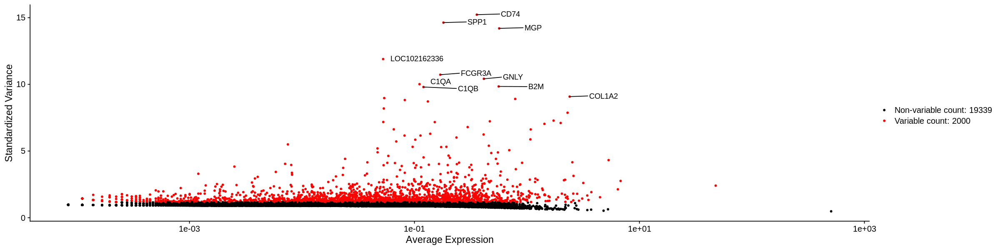

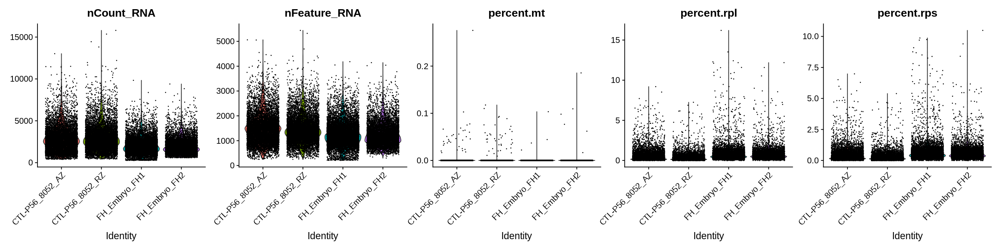

Preprocessed dimension plots

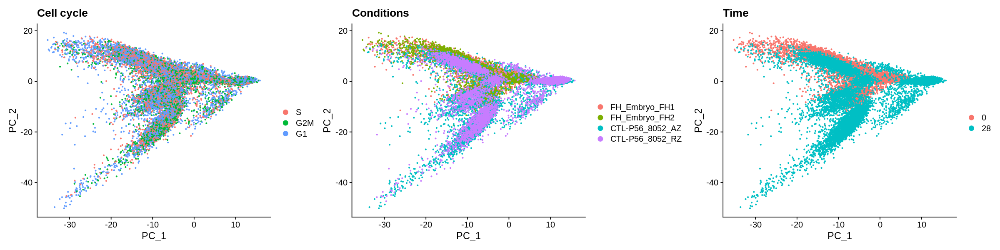

Regressed for confounds dimension plots

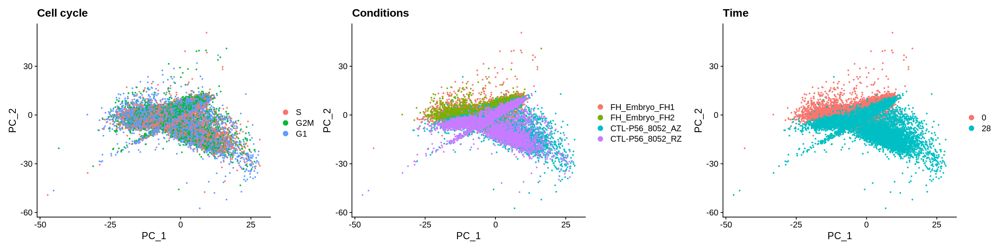

Elbow plot for dimensions

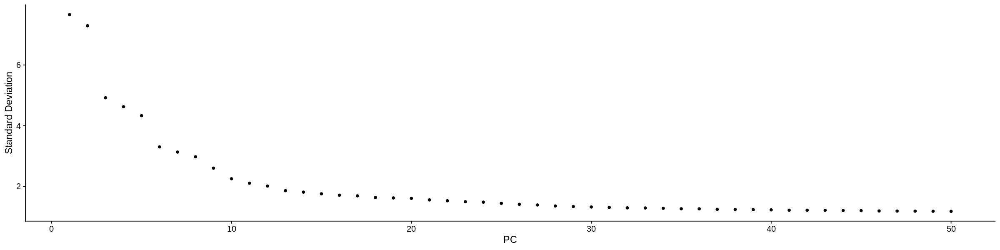

UMAP clustered plots

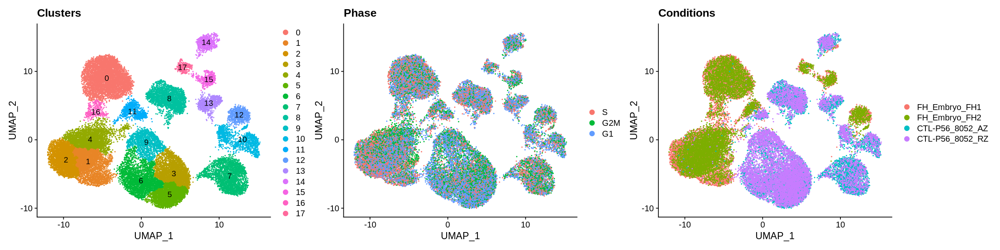

Differentially expressed genes in cardiac clusters

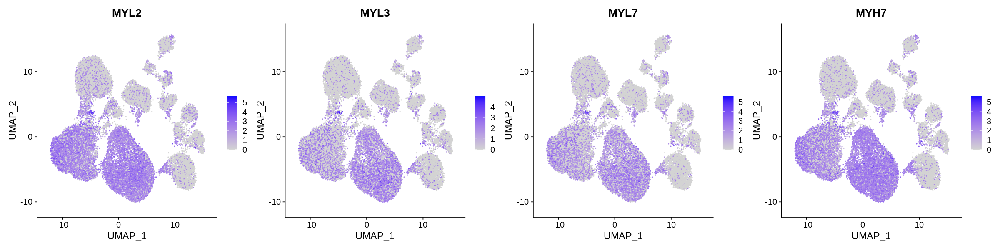

In [ ]:
#@title Fetal vs P56
FH_P56 = Cardiac_Enrichment(c('FH_Embryo_FH1', 'FH_Embryo_FH2', 'CTL-P56_8052_AZ', 'CTL-P56_8052_RZ'), nclusters = 20, cardiac_genes = genes)

Loading hg19 length data...

Warning message in pcls(G):
“initial point very close to some inequality constraints”
Fetching GO annotations...

Calculating the p-values...

'select()' returned 1:1 mapping between keys and columns



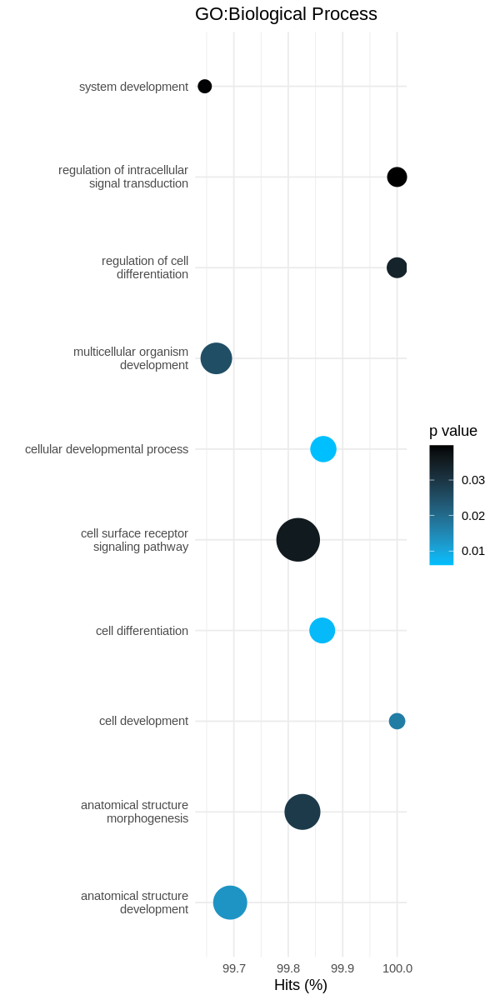

In [ ]:
#@title Fetal Vs. P56 pathway analysis
up_reg = as.integer(FH_P56$gene_enrichment$p_val < 1e-3 & FH_P56$gene_enrichment$avg_logFC > log2(1/2))
names(up_reg) = FH_P56$gene_enrichment$gene
up_reg = up_reg[which(!duplicated(names(up_reg)))]
pwf <- nullp(up_reg, 'hg19', "geneSymbol", plot.fit = FALSE)
go_res_BP = goseq(pwf, 'hg19',"geneSymbol", test.cats = c("GO:BP"), use_genes_without_cat=TRUE)
options(repr.plot.width = 5, repr.plot.height = 10)
go_res_BP %>%
    dplyr::filter(numInCat < 1000) %>%
    top_n(10, wt = -over_represented_pvalue) %>%
    mutate(hitsPerc = numDEInCat*100/numInCat, term = str_wrap(term, 30)) %>%
    ggplot(aes(x = hitsPerc, y = term, colour = over_represented_pvalue, size = numDEInCat)) + 
    geom_point(size = top_n(go_res_BP, 10, wt = -over_represented_pvalue)$numDEInCat/90) +
    scale_color_gradient(low = "deepskyblue", high = "black") + 
    labs(title = "GO:Biological Process", x="Hits (%)", y="", colour="p value", size="Count") +
    theme(axis.text = element_text(size = 15, face = 'bold')) + 
    theme(legend.text = element_text(size = 15, face = 'bold')) + 
    theme(legend.title = element_text(size = 15, face = 'bold')) +
    theme_minimal()

Merging Suerat Objects 


Centering and scaling data matrix



Plotting variable features 


When using repel, set xnudge and ynudge to 0 for optimal results



Performing Cell Cycle Scoring Analysis 


Warning message:
“The following features are not present in the object: MCM5, MLF1IP, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: FAM64A, TUBB4B, HN1, not searching for symbol synonyms”
PC_ 1 
Positive:  TTN, NEBL, RBM24, RYR2, SORBS2, CMYA5, SLC8A1, PDLIM5, PDE4D, MYBPC3 
	   MYH7B, FHL2, ATP2A2, SORBS1, MYH7, SLC25A4, ACTC1, LMO7, TNNT2, DMD 
	   RNF207, TNNI3, PPARGC1A, LDB3, MYL2, LOC100624559, TCAP, MLIP, ABLIM1, ANKRD1 
Negative:  DCN, COL1A1, COL3A1, COL1A2, GSN, SPON2, MFAP5, COL5A2, IGF2, LTBP4 
	   SPARC, MEG3, EPB41L2, FSTL1, FN1, OGN, TIMP2, MARCKS, POSTN, AKAP12 
	   EBF1, COL14A1, SPARCL1, SPRY2, PRELP, LOC100623720, TCF21, MATN2, MMP2, LUM 
PC_ 2 
Positive:  LOC100624077, CD74, CD163, CSF1R, C1QB, SLA-3, STAB1, SLA-2, C1QA, MRC1 
	   SLA-1, SLA-DQB1, B2M, SLA-DRB1, C1QC, DAB2, FGD2, SLA-DQA1, VSIG4, SLA-DRA 
	   OAS2, GIMAP1, NPL, PTPRC, CCDC7, FCGR3A, CCL14, CCL24, IFI6, FAM105A 
Negative:  TTN, TBX20, DCN, 

Plotting dimensions 1 and 2 for Cell cycle and Condition 


Regressing out nCount_RNA, nFeature_RNA, percent.mt, percent.rpl, percent.rps, S.Score, G2M.Score, Phase

Centering and scaling data matrix



Finding variable features and running PCA 


PC_ 1 
Positive:  TTN, NEBL, RBM24, SORBS2, RYR2, SLC8A1, MYH7B, PDE4D, PDLIM5, CMYA5 
	   ATP2A2, ACTC1, NREP, FHL2, MYBPC3, CDH2, MYH7, MYL2, RNF207, SORBS1 
	   LOC110256756, LRRTM3, LOC100517194, LMO7, DMD, RRAD, CTNNA3, TCAP, LOC110256084, SLC25A4 
Negative:  DCN, COL1A1, COL3A1, GSN, COL1A2, MFAP5, SPON2, MEG3, COL5A2, LTBP4 
	   EPB41L2, IGF2, SPARC, EBF1, LOC100623720, SPRY2, FSTL1, COL14A1, LUM, LOC100520512 
	   FN1, TIMP2, TNXB, SPARCL1, OGN, PDGFRA, AKAP12, MGP, LOC110257158, COL15A1 
PC_ 2 
Positive:  CD74, LOC100624077, CD163, SLA-3, SLA-2, CSF1R, SLA-1, B2M, C1QB, STAB1 
	   SLA-DQB1, C1QA, MRC1, SLA-DRB1, SLA-DQA1, SLA-DRA, DAB2, C1QC, OAS2, PECAM1 
	   IFI6, FGD2, GIMAP1, VSIG4, PTPRC, TMSB4X, FCGR3A, NPL, ARAP3, CCDC7 
Negative:  NREP, COL1A2, DCN, ADGRD1, TBX20, COL1A1, COL3A1, TTN, RBM24, SORBS2 
	   SPON2, LOC110261648, ABLIM1, MYH7B, SLC8A1, RYR2, MEG3, LOC110259223, GSN, ZDBF2 
	   NEBL, PDLIM5, OGN, FSTL1, MFAP5, CMYA5, SOX4, ACTC1, PTPRD, COL21A1 
PC_ 3 
Positi

Replotting dimensions 1 and 2 for Cell cycle and Condition 
Plotting elbow plot 
Running UMAP 
Clustering 


Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 28617
Number of edges: 639578

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9766
Number of communities: 18
Elapsed time: 2 seconds
Plotting UMAP 


Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 14

Calculating cluster 15

Calculating cluster 16

Calculating cluster 17



Table of differentially expressed genes in cardiac gene cluster 


|             | p_val| avg_logFC| pct.1| pct.2| p_val_adj|cluster |gene         |
|:------------|-----:|---------:|-----:|-----:|---------:|:-------|:------------|
|NPPB         |     0| 1.1416150| 0.267| 0.069|         0|0       |NPPB         |
|NREP         |     0| 1.0316193| 0.988| 0.621|         0|0       |NREP         |
|LOC110256084 |     0| 0.9803211| 0.822| 0.432|         0|0       |LOC110256084 |
|LOC110257297 |     0| 0.9191329| 0.473| 0.136|         0|0       |LOC110257297 |
|LOC110256885 |     0| 0.9168207| 0.584| 0.199|         0|0       |LOC110256885 |
|SORBS2       |     0| 0.9168203| 0.964| 0.500|         0|0       |SORBS2       |
Variable features plot

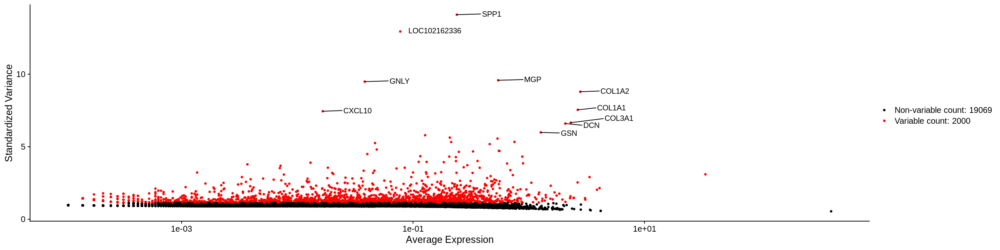

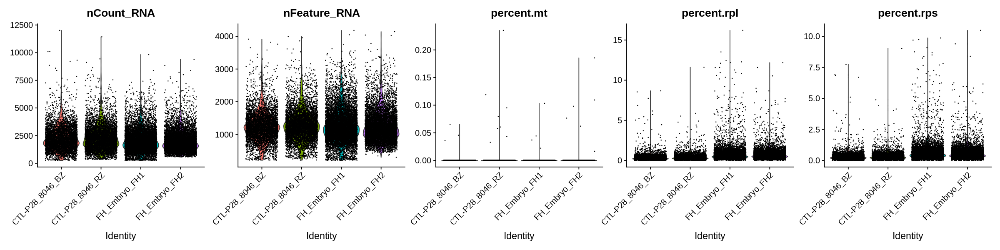

Preprocessed dimension plots

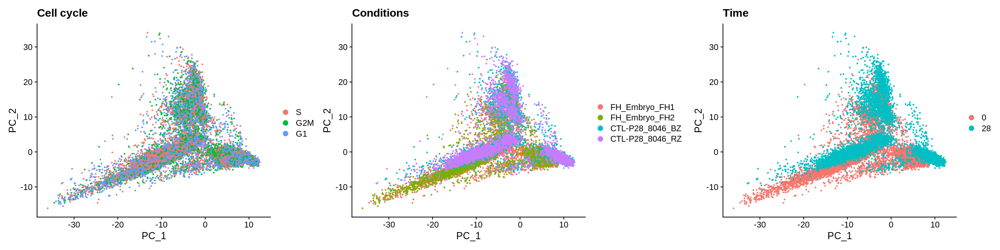

Regressed for confounds dimension plots

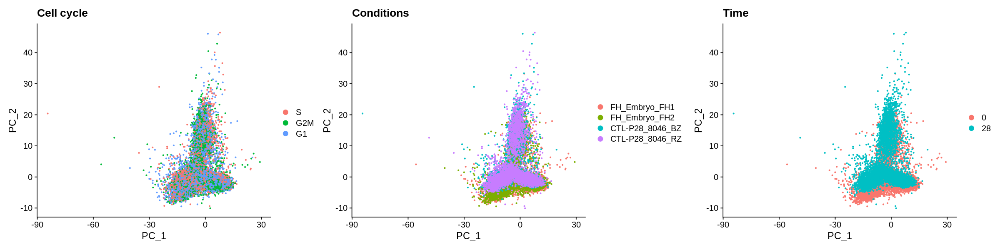

Elbow plot for dimensions

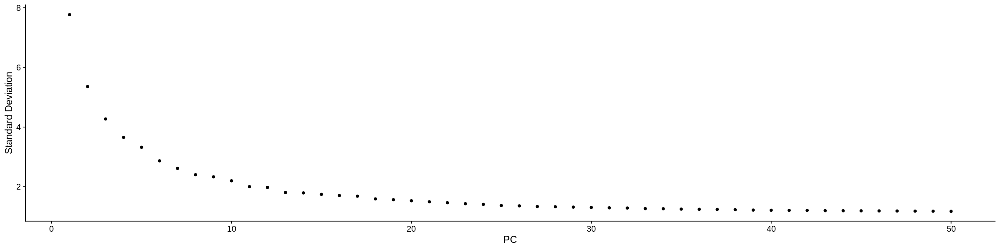

UMAP clustered plots

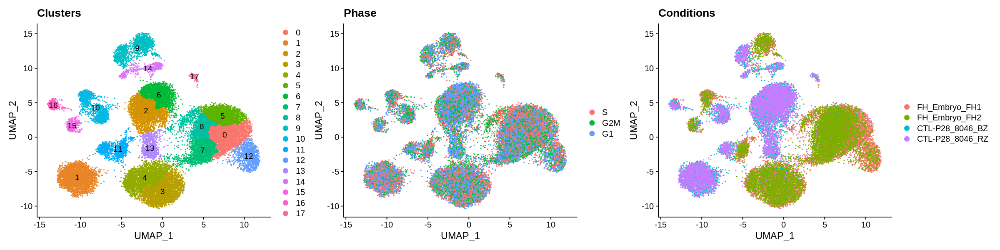

Differentially expressed genes in cardiac clusters

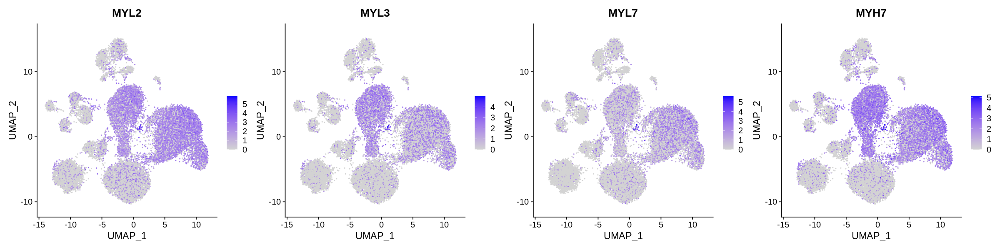

In [ ]:
#@title Fetal vs P28
FH_P28 = Cardiac_Enrichment(c('FH_Embryo_FH1', 'FH_Embryo_FH2', 'CTL-P28_8046_BZ', 'CTL-P28_8046_RZ'), nclusters = 20, cardiac_genes = genes)

Loading hg19 length data...

Fetching GO annotations...

Calculating the p-values...

'select()' returned 1:1 mapping between keys and columns



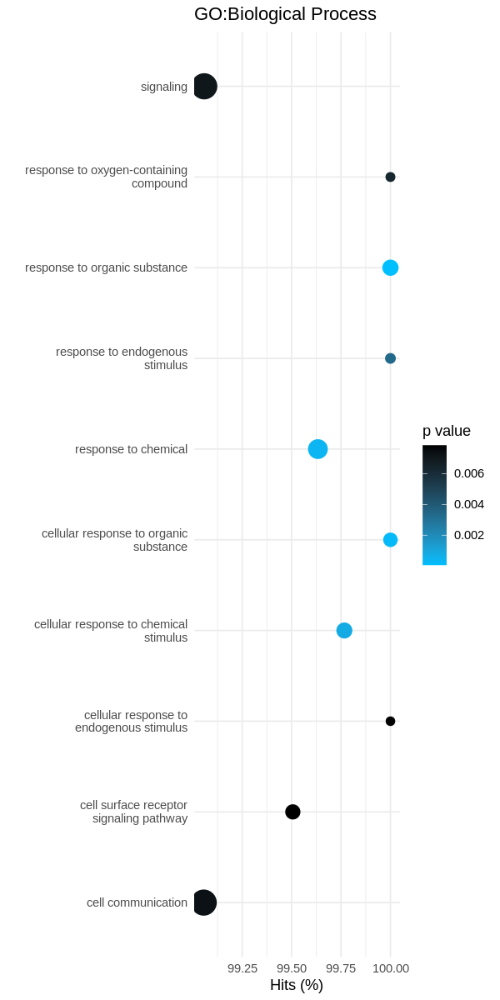

In [ ]:
#@title Fetal Vs. P28 pathway analysis
up_reg = as.integer(FH_P28$gene_enrichment$p_val < 1e-3 & FH_P28$gene_enrichment$avg_logFC > log2(1/2))
names(up_reg) = FH_P28$gene_enrichment$gene
up_reg = up_reg[which(!duplicated(names(up_reg)))]
pwf <- nullp(up_reg, 'hg19', "geneSymbol", plot.fit = FALSE)
go_res_BP = goseq(pwf, 'hg19',"geneSymbol", test.cats = c("GO:BP"), use_genes_without_cat=TRUE)
options(repr.plot.width = 5, repr.plot.height = 10)
go_res_BP %>%
    dplyr::filter(numInCat < 1000) %>% 
    top_n(10, wt = -over_represented_pvalue) %>%
    mutate(hitsPerc = numDEInCat*100/numInCat, term = str_wrap(term, 30)) %>%
    ggplot(aes(x = hitsPerc, y = term, colour = over_represented_pvalue, size = numDEInCat)) + 
    geom_point(size = top_n(go_res_BP, 10, wt = -over_represented_pvalue)$numDEInCat/90) +
    scale_color_gradient(low = "deepskyblue", high = "black") + 
    labs(title = "GO:Biological Process", x="Hits (%)", y="", colour="p value", size="Count") +
    theme(axis.text = element_text(size = 15, face = 'bold')) + 
    theme(legend.text = element_text(size = 15, face = 'bold')) + 
    theme(legend.title = element_text(size = 15, face = 'bold')) +
    theme_minimal()

Merging Suerat Objects 


Centering and scaling data matrix



Plotting variable features 


When using repel, set xnudge and ynudge to 0 for optimal results



Performing Cell Cycle Scoring Analysis 


Warning message:
“The following features are not present in the object: MCM5, MLF1IP, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: FAM64A, TUBB4B, HN1, not searching for symbol synonyms”
PC_ 1 
Positive:  TTN, NEBL, SORBS2, SLC8A1, RYR2, RBM24, PDE4D, CMYA5, PDLIM5, MYBPC3 
	   ATP2A2, ACTC1, NREP, FHL2, LMO7, MYL2, MYH7, TPM2, TCAP, SLC25A4 
	   DMD, SORBS1, TNNT2, LOC110256756, MYL3, TNNI3, NEXN, LDB3, LOC100513133, ACTN2 
Negative:  COL3A1, COL1A1, DCN, COL1A2, GSN, SPON2, COL5A2, SPARC, MFAP5, IGF2 
	   LTBP4, EPB41L2, FSTL1, MEG3, FN1, MARCKS, COL14A1, EBF1, TIMP2, POSTN 
	   OGN, SPARCL1, COL21A1, AKAP12, LUM, FBN1, EMP1, LOC100623720, VIM, MMP2 
PC_ 2 
Positive:  DCN, COL3A1, ADGRD1, COL1A2, COL1A1, MEG3, LOC110261648, TBX20, SPON2, GSN 
	   COL5A2, MFAP5, FSTL1, COL21A1, POSTN, LOC110257158, IGF2, ASPN, LOC110259223, MFAP4 
	   LTBP4, OGN, PRELP, MATN2, FN1, COL14A1, NREP, PDGFRA, COL12A1, TCF21 
Negative:  CD163, C1

Plotting dimensions 1 and 2 for Cell cycle and Condition 


Regressing out nCount_RNA, nFeature_RNA, percent.mt, percent.rpl, percent.rps, S.Score, G2M.Score, Phase

Centering and scaling data matrix



Finding variable features and running PCA 


PC_ 1 
Positive:  TTN, NEBL, SORBS2, RYR2, SLC8A1, RBM24, PDLIM5, PDE4D, CMYA5, ACTC1 
	   MYBPC3, ATP2A2, NREP, MYH7, MYL2, FHL2, LMO7, SLC25A4, LOC110256756, TCAP 
	   SORBS1, DMD, TPM2, TNNT2, TNNI3, MYL3, LDB3, RRAD, LOC110256084, MYL7 
Negative:  COL3A1, COL1A1, DCN, COL1A2, GSN, SPON2, COL5A2, MEG3, MFAP5, SPARC 
	   IGF2, LTBP4, EPB41L2, FSTL1, FN1, COL14A1, POSTN, COL21A1, EBF1, LOC110261648 
	   OGN, LUM, LOC100623720, PDGFRA, MATN2, FBN1, PRELP, AKAP12, MMP2, SPARCL1 
PC_ 2 
Positive:  NREP, TTN, SORBS2, RBM24, NEBL, SLC8A1, RYR2, PDLIM5, CMYA5, ATP2A2 
	   MYBPC3, PDE4D, LOC110256084, ACTC1, FHL2, ADGRD1, DMD, LOC110256756, TBX20, ZDBF2 
	   LMO7, RRAD, SORBS1, SOX4, TCAP, MYH7, SEMA5A, MYL2, LOC102160748, LOC110257297 
Negative:  CD163, LOC100624077, C1QB, CSF1R, C1QA, FOLR1, CD14, C1QC, STAB1, MRC1 
	   FCGR3A, PTPRC, DAB2, SRGN, CD74, SLA-2, CST3, SLA-1, SLA-DQB1, CCL24 
	   VSIG4, IRF5, LOC100516039, FCER1G, TYROBP, LAPTM5, CCDC7, CCL14, GIMAP1, RNASET2 
PC_ 3 
Positive:

Replotting dimensions 1 and 2 for Cell cycle and Condition 
Plotting elbow plot 
Running UMAP 
Clustering 


Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 30798
Number of edges: 689866

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9753
Number of communities: 17
Elapsed time: 2 seconds
Plotting UMAP 


Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 14

Calculating cluster 15

Calculating cluster 16



Table of differentially expressed genes in cardiac gene cluster 


|             | p_val| avg_logFC| pct.1| pct.2| p_val_adj|cluster |gene         |
|:------------|-----:|---------:|-----:|-----:|---------:|:-------|:------------|
|RRAD         |     0| 1.0523987| 0.593| 0.231|         0|0       |RRAD         |
|LOC110257297 |     0| 1.0460483| 0.486| 0.122|         0|0       |LOC110257297 |
|LOC110256084 |     0| 1.0256337| 0.816| 0.428|         0|0       |LOC110256084 |
|NREP         |     0| 0.8748969| 0.989| 0.755|         0|0       |NREP         |
|RBM24        |     0| 0.8708262| 0.937| 0.547|         0|0       |RBM24        |
|LOC110256885 |     0| 0.8272833| 0.554| 0.242|         0|0       |LOC110256885 |
Variable features plot

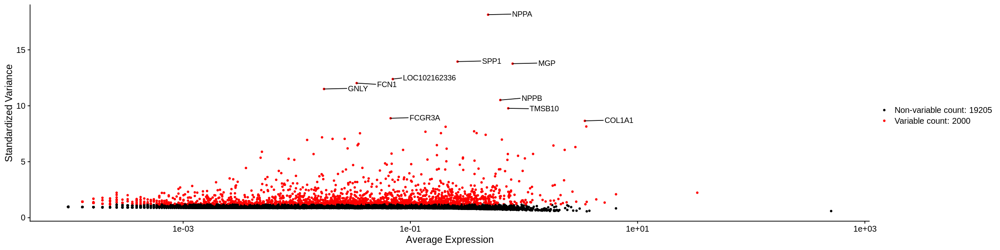

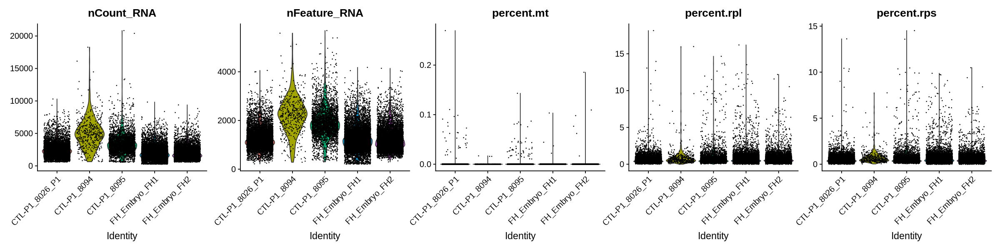

Preprocessed dimension plots

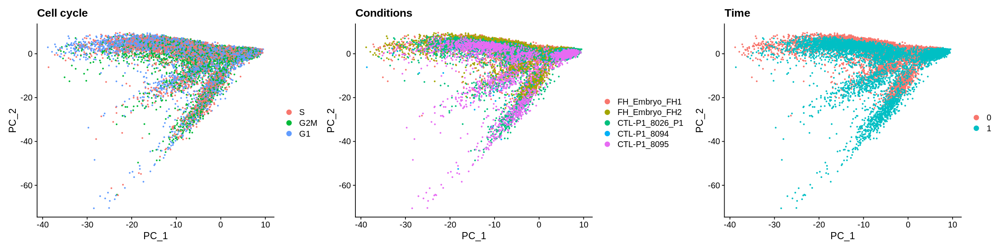

Regressed for confounds dimension plots

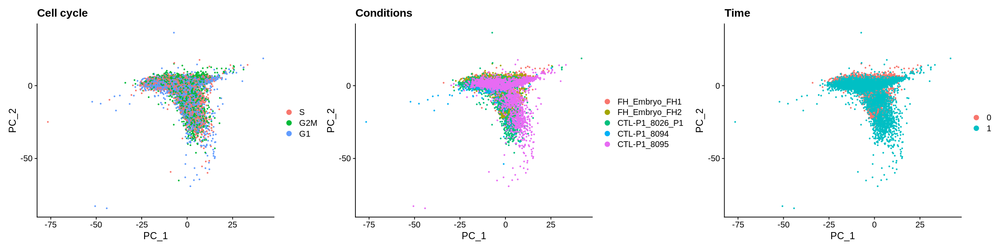

Elbow plot for dimensions

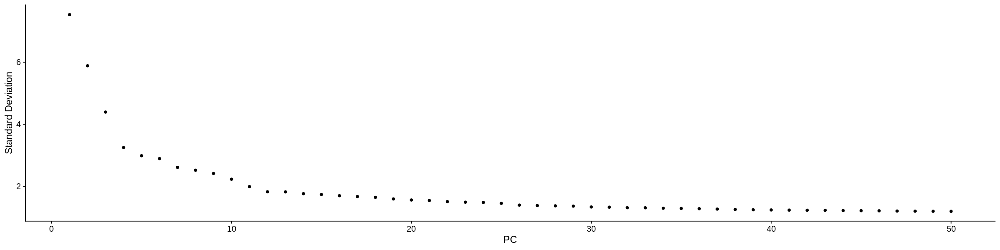

UMAP clustered plots

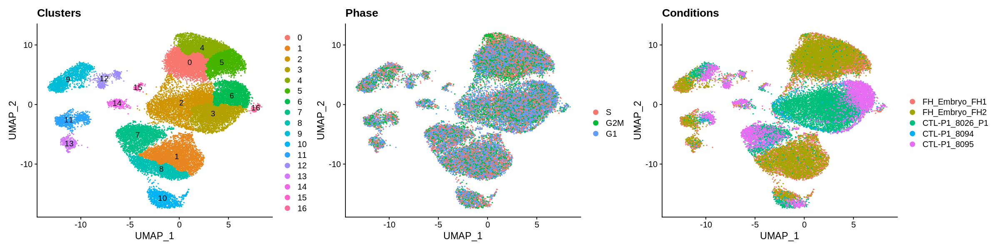

Differentially expressed genes in cardiac clusters

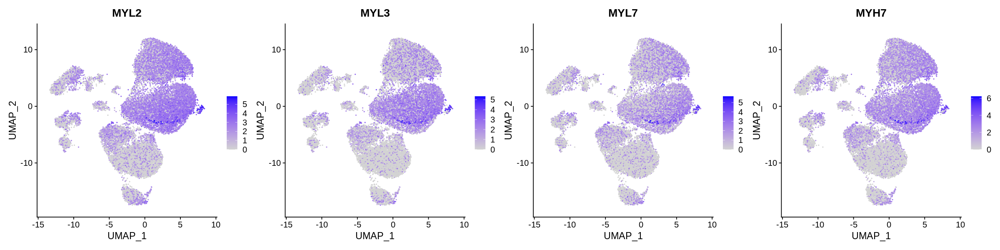

In [ ]:
#@title Fetal vs P1
FH_P1 = Cardiac_Enrichment(c('FH_Embryo_FH1', 'FH_Embryo_FH2', 'CTL-P1_8026_P1', 'CTL-P1_8094', 'CTL-P1_8095'), nclusters = 20, cardiac_genes = genes)

Loading hg19 length data...

Warning message in pcls(G):
“initial point very close to some inequality constraints”
Fetching GO annotations...

Calculating the p-values...

'select()' returned 1:1 mapping between keys and columns



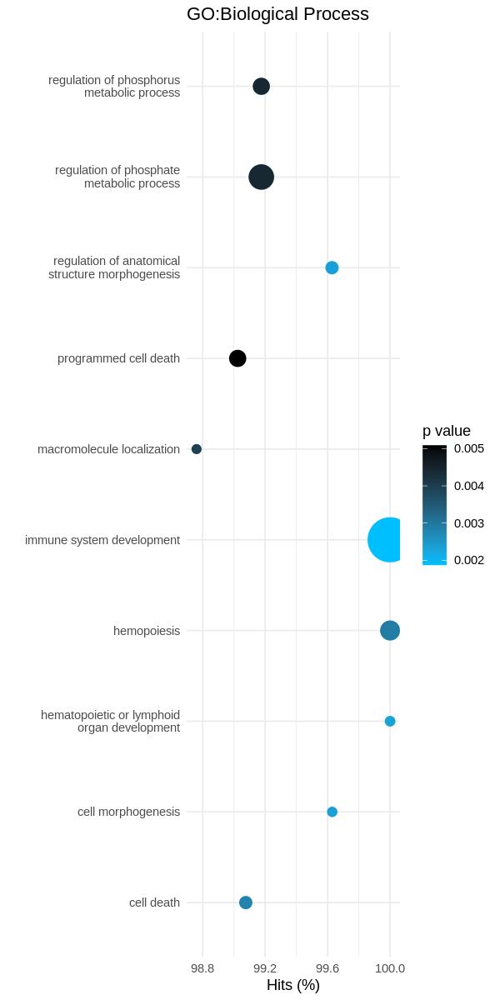

In [ ]:
#@title Fetal Vs. P1 pathway analysis
up_reg = as.integer(FH_P1$gene_enrichment$p_val < 1e-3 & FH_P1$gene_enrichment$avg_logFC > log2(1/2))
names(up_reg) = FH_P1$gene_enrichment$gene
up_reg = up_reg[which(!duplicated(names(up_reg)))]
pwf <- nullp(up_reg, 'hg19', "geneSymbol", plot.fit = FALSE)
go_res_BP = goseq(pwf, 'hg19',"geneSymbol", test.cats = c("GO:BP"), use_genes_without_cat=TRUE)
options(repr.plot.width = 5, repr.plot.height = 10)
go_res_BP %>%
    dplyr::filter(numInCat < 1000) %>%
    top_n(10, wt = -over_represented_pvalue) %>%
    mutate(hitsPerc = numDEInCat*100/numInCat, term = str_wrap(term, 30)) %>%
    ggplot(aes(x = hitsPerc, y = term, colour = over_represented_pvalue, size = numDEInCat)) + 
    geom_point(size = top_n(go_res_BP, 10, wt = -over_represented_pvalue)$numDEInCat/70) +
    scale_color_gradient(low = "deepskyblue", high = "black") + 
    labs(title = "GO:Biological Process", x="Hits (%)", y="", colour="p value", size="Count") +
    theme(axis.text = element_text(size = 15, face = 'bold')) + 
    theme(legend.text = element_text(size = 15, face = 'bold')) + 
    theme(legend.title = element_text(size = 15, face = 'bold')) +
    theme_minimal()